In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# ! pip uninstall numba -y && pip install numba

In [3]:
import os
import sys

# Получаем абсолютный путь к корневой директории проекта (директория выше текущей)
root_path = os.path.abspath(os.path.join(os.getcwd(), '..'))

# Добавляем корневую директорию в sys.path
if root_path not in sys.path:
    sys.path.append(root_path)

In [4]:
from model_loaders import load_ss_model
import weightwatcher as ww
from matplotlib import pyplot as plt
from pipeline import separate_audio
import torch
from utils import parse_yaml
from models.clap_encoder import CLAP_Encoder
import IPython.display as ipd
from models.audiosep_lora import AudioSepLora

2024-03-14 21:22:19.758461: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-14 21:22:19.758488: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-14 21:22:19.759452: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-14 21:22:19.764563: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-14 21:22:20.337894: W tensorflow/compiler/tf2

In [5]:
SS_CONFIG_PATH = '../config/audiosep_base.yaml'
CLAP_CKPT_PATH = '../checkpoint/music_speech_audioset_epoch_15_esc_89.98.pt'
AUDIOSEP_CKPT_PATH = '../checkpoint/audiosep_base_4M_steps.ckpt'

In [6]:
def describe_weights(model):
    watcher = ww.WeightWatcher()
    details = watcher.analyze(model=model)
    summary = watcher.get_summary(details)

    return details, summary

def plot_hist(details):
    avg_alpha = details.alpha.mean()

    title=f"WeightWatcher Alpha"
    details.alpha.plot.hist(bins=100)
    plt.title(title)
    plt.axvline(x=avg_alpha, color='green',label=f"<alpha> = {avg_alpha:0.3f}")
    plt.legend()

In [7]:
device = torch.device('cuda')
configs = parse_yaml(SS_CONFIG_PATH)

In [8]:
audio_file = '../audios/test.wav'
output_file = '../separation_result/test.wav'

In [9]:
query_encoder = CLAP_Encoder(pretrained_path = CLAP_CKPT_PATH).eval().to(device)
base_model = load_ss_model(configs=configs, checkpoint_path=AUDIOSEP_CKPT_PATH, query_encoder=query_encoder).eval().to(device)

2024-03-14 21:22:23,794 - INFO - Loading HTSAT-base model config.
2024-03-14 21:22:25,733 - INFO - Loading pretrained HTSAT-base-roberta weights (../checkpoint/music_speech_audioset_epoch_15_esc_89.98.pt).


In [14]:
from models.audiosep_lora_and_tuned_embeddings import AudioSepLoraAndTunedEmbeddings

query_encoder_for_lora = CLAP_Encoder(pretrained_path = CLAP_CKPT_PATH).eval().to(device)
base_model_for_lora = load_ss_model(configs=configs, checkpoint_path=AUDIOSEP_CKPT_PATH, query_encoder=query_encoder_for_lora).eval().to(device)

lora_model = AudioSepLoraAndTunedEmbeddings.load_from_checkpoint(
    checkpoint_path='../checkpoints/train_audiosep_lora_and_tuned_embeddings/audiosep_lora_and_tuned_embeddings_musdb18,timestamp=1710440713.6042292/epoch=1.ckpt',
    strict=False,
    pretrained_audiosep_model = base_model_for_lora,
    loss_function=None,
    waveform_mixer=None,
    lr_lambda_func=None
) \
    .eval() \
    .to(device)

merged_lora_model = lora_model.model.merge_and_unload()

2024-03-14 21:26:57,338 - INFO - Loading HTSAT-base model config.
2024-03-14 21:26:58,588 - INFO - Loading pretrained HTSAT-base-roberta weights (../checkpoint/music_speech_audioset_epoch_15_esc_89.98.pt).


Parameter containing:
tensor([[1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        ...,
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.],
        [1., 1., 1.,  ..., 1., 1., 1.]], requires_grad=True)


In [17]:
www = torch.load('../checkpoints/train_audiosep_lora_and_tuned_embeddings/audiosep_lora_and_tuned_embeddings_musdb18,timestamp=1710440713.6042292/epoch=1.ckpt')

In [18]:
[v for k, v in www['state_dict'].items() if 'embedding_layer' in k.lower()]

[tensor([[0.9921, 1.0031, 0.9921,  ..., 1.0041, 0.9946, 1.0080],
         [1.0014, 1.0014, 1.0014,  ..., 0.9978, 0.9978, 0.9978],
         [0.9998, 0.9998, 0.9998,  ..., 0.9994, 0.9994, 0.9994],
         ...,
         [0.9998, 0.9939, 0.9998,  ..., 1.0010, 1.0070, 0.9978],
         [1.0018, 1.0018, 1.0018,  ..., 0.9974, 0.9974, 0.9974],
         [0.9995, 0.9995, 0.9995,  ..., 0.9997, 0.9997, 0.9997]],
        device='cuda:0'),
 tensor([ 4.8073e-02,  1.9017e-02, -5.6965e-04, -1.7481e-02, -2.3289e-02,
          1.4226e-02,  3.3785e-02, -2.4578e-02, -2.0348e-02, -1.7825e-03,
         -7.9406e-03,  1.2954e-02, -5.9588e-03,  4.7204e-02,  7.6391e-03,
         -2.0597e-03, -2.7779e-03,  1.0376e-02, -2.1191e-02,  5.2880e-03,
          3.4188e-02, -1.5594e-02,  1.8736e-02, -3.0039e-02,  4.6484e-03,
         -1.3557e-02, -3.7476e-02,  2.4819e-02, -3.9152e-02,  1.3583e-02,
          3.8160e-02, -2.4976e-02,  4.5495e-03,  2.0860e-02, -2.0251e-02,
          3.1903e-02,  1.7210e-02,  3.8994e-02, -1.

{'log_norm': 0.9726405506281502, 'alpha': 4.0350800891208305, 'alpha_weighted': -0.9384073510832674, 'log_alpha_norm': -0.1290078993318814, 'log_spectral_norm': -0.20948652514005875, 'stable_rank': 21.691399796552908}


,layer_id,name,D,M,N,Q,alpha,alpha_weighted,entropy,has_esd,...,sigma,spectral_norm,stable_rank,status,sv_max,sv_min,warning,weak_rank_loss,xmax,xmin
0,3,model.base_model.model.ss_model.base.encoder_b...,0.078181,8,32,4.0,3.844605,-3.379894,0.943654,True,...,0.689918,0.132091,12.508467,success,0.363443,0.100600,,0,0.132091,0.031011
1,5,model.base_model.model.ss_model.base.encoder_b...,0.095561,8,32,4.0,3.149343,-2.887568,0.941529,True,...,0.429869,0.121093,17.931557,success,0.347985,0.102471,,0,0.121093,0.032480
2,7,model.base_model.model.ss_model.base.encoder_b...,0.105060,8,32,4.0,2.657560,-2.615471,0.945461,True,...,0.252776,0.103714,21.464135,success,0.322047,0.101206,,0,0.103714,0.021067
3,9,model.base_model.model.ss_model.base.encoder_b...,0.107273,8,64,8.0,2.188313,-1.464613,0.892843,True,...,0.161709,0.214147,14.724262,success,0.462760,0.111640,,0,0.214147,0.016262
4,13,model.base_model.model.ss_model.base.encoder_b...,0.109149,8,64,8.0,2.182535,-1.391937,0.901421,True,...,0.167236,0.230271,15.990478,success,0.479865,0.122903,,0,0.230271,0.021108
5,15,model.base_model.model.ss_model.base.encoder_b...,0.121679,8,128,16.0,1.820368,-0.796894,0.891201,True,...,0.096681,0.364951,16.478681,success,0.604112,0.142766,over-trained,0,0.364951,0.015503
6,19,model.base_model.model.ss_model.base.encoder_b...,0.106887,8,128,16.0,1.728200,-0.221110,0.844234,True,...,0.085819,0.744831,12.618407,success,0.863036,0.143298,over-trained,0,0.744831,0.016324
7,21,model.base_model.model.ss_model.base.encoder_b...,0.145586,8,256,32.0,1.676640,0.137868,0.782797,True,...,0.079743,1.208449,14.461081,success,1.099295,0.148132,over-trained,0,1.208449,0.017252
8,25,model.base_model.model.ss_model.base.encoder_b...,0.102323,8,256,32.0,1.651051,0.338408,0.770733,True,...,0.076727,1.603117,10.811087,success,1.266142,0.141576,over-trained,0,1.603117,0.016563
9,27,model.base_model.model.ss_model.base.encoder_b...,0.142532,8,384,48.0,1.677211,0.594416,0.737680,True,...,0.079810,2.261558,11.289822,success,1.503848,0.146880,over-trained,0,2.261558,0.019601


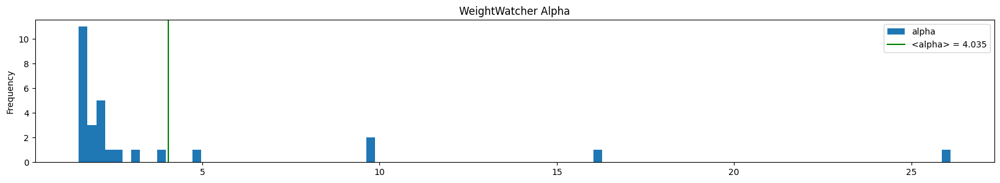

In [47]:
test_details, test_summary = describe_weights(www)
plot_hist(test_details)
print(test_summary)
test_details

In [39]:
[k for k, v in lora_model.state_dict().items() if 'embedding_layer' in k.lower()]

['embedding_layer.0.weight',
 'embedding_layer.0.bias',
 'embedding_layer.2.weight',
 'embedding_layer.2.bias']

In [11]:
text = 'drums'

In [12]:
output_file2 = '../separation_result/test2.wav'

# AudioSep processes the audio at 32 kHz sampling rate
separate_audio(merged_lora_model, audio_file, text, output_file2, device, use_chunk=True, additional_embedding_layer=lora_model.embedding_layer)

Separating audio from [../audios/test.wav] with textual query: [drums]
Separated audio written to [../separation_result/test2.wav]


In [13]:
ipd.Audio('../separation_result/test2.wav') # load a local WAV file

In [14]:
plt.rcParams["figure.figsize"] = (20,3)

{'log_norm': 3.4622441728944704, 'alpha': 3.4710740844774923, 'alpha_weighted': 6.590802155253461, 'log_alpha_norm': 7.088332035155279, 'log_spectral_norm': 2.1900739450051367, 'stable_rank': 39.89981500874082}


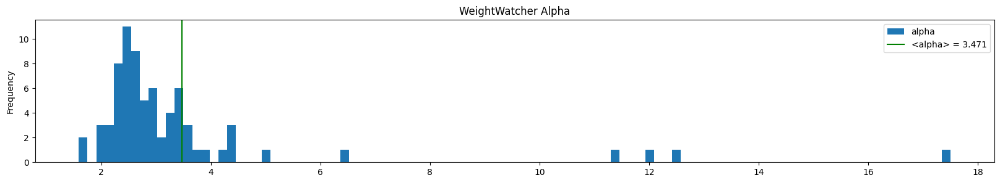

In [15]:
base_details, base_summary = describe_weights(base_model.ss_model)
plot_hist(base_details)
print(base_summary)

{'log_norm': 3.462791015738482, 'alpha': 3.4916334073823245, 'alpha_weighted': 6.626075072458772, 'log_alpha_norm': 7.117438968309142, 'log_spectral_norm': 2.190342032604388, 'stable_rank': 39.94638339816448}


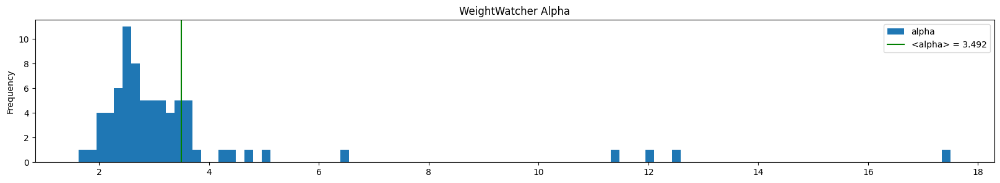

In [16]:
lora_details, lora_summary = describe_weights(merged_lora_model.ss_model)
plot_hist(lora_details)
print(lora_summary)

In [17]:
watcher = ww.WeightWatcher()
avg_dW, avg_db, distances = watcher.distances(base_model.ss_model, merged_lora_model.ss_model)
avg_dW, avg_db

(2.852, 0.0)

In [18]:
distances

,method,name,delta_W,delta_b,M,N,b_shape,longname
layer_id,,,,,,,,
14,raw,Conv2d,0.742676,0.0,3,32,unknown,base.encoder_block1.conv_block1.conv1
15,raw,Conv2d,0.369141,0.0,3,32,unknown,base.encoder_block1.conv_block1.conv2
20,raw,Conv2d,0.806152,0.0,3,64,unknown,base.encoder_block2.conv_block1.conv1
21,raw,Conv2d,2.013672,0.0,3,64,unknown,base.encoder_block2.conv_block1.conv2
22,raw,Conv2d,0.350098,0.0,1,64,unknown,base.encoder_block2.conv_block1.shortcut
...,...,...,...,...,...,...,...,...
151,raw,Linear,0.000000,0.0,64,512,64,film.decoder_block5->conv_block2->beta2
152,raw,Linear,0.000000,0.0,64,512,64,film.decoder_block6->beta1
153,raw,Linear,0.000000,0.0,64,512,64,film.decoder_block6->beta2


In [19]:
print(merged_lora_model)

AudioSep(
  (ss_model): ResUNet30(
    (base): ResUNet30_Base(
      (stft): STFT(
        (conv_real): Conv1d(1, 1025, kernel_size=(2048,), stride=(320,), bias=False)
        (conv_imag): Conv1d(1, 1025, kernel_size=(2048,), stride=(320,), bias=False)
      )
      (istft): ISTFT(
        (conv_real): Conv1d(2048, 2048, kernel_size=(1,), stride=(1,), bias=False)
        (conv_imag): Conv1d(2048, 2048, kernel_size=(1,), stride=(1,), bias=False)
      )
      (bn0): BatchNorm2d(1025, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
      (pre_conv): Conv2d(1, 32, kernel_size=(1, 1), stride=(1, 1))
      (encoder_block1): EncoderBlockRes1B(
        (conv_block1): ConvBlockRes(
          (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
          (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
          (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
       

In [20]:
conv_distances = distances[distances['name']=='Conv2d']

In [21]:
import pandas as pd

df_split = conv_distances['longname'].str.split('.', expand=True)

# Объединение разделенных частей с исходным DataFrame
df_expanded = pd.concat([df_split, conv_distances['delta_W']], axis=1)

# Группировка и суммирование значений
# Уровень группировки будет увеличиваться на каждом шаге
for level in range(df_expanded.shape[1] - 1):  # Исключаем колонку 'value'
    grouped_df = df_expanded.groupby(list(range(level + 1))).sum().reset_index()
    grouped_df = grouped_df.sort_values(by='delta_W', ascending=False)
    print(f"Группировка по уровню {level + 1}:\n", grouped_df, "\n")


Группировка по уровню 1:
       0     delta_W
0  base  211.010925 

Группировка по уровню 2:
        0               1    delta_W
11  base  encoder_block5  37.650391
2   base  decoder_block2  35.871094
1   base  decoder_block1  32.316406
3   base  decoder_block3  22.984375
12  base  encoder_block6  22.562500
0   base    conv_block7a  18.796875
10  base  encoder_block4  17.996094
4   base  decoder_block4   8.413086
9   base  encoder_block3   5.359375
5   base  decoder_block5   3.405273
8   base  encoder_block2   3.169922
6   base  decoder_block6   1.373718
7   base  encoder_block1   1.111816 

Группировка по уровню 3:
        0               1            2    delta_W
11  base  encoder_block5  conv_block1  37.650391
2   base  decoder_block2  conv_block2  35.871094
1   base  decoder_block1  conv_block2  32.316406
3   base  decoder_block3  conv_block2  22.984375
12  base  encoder_block6  conv_block1  22.562500
0   base    conv_block7a  conv_block1  18.796875
10  base  encoder_block4  conv_

In [26]:
base_details[base_details['warning']!= '']

,layer_id,name,D,M,N,Q,alpha,alpha_weighted,entropy,has_esd,...,sigma,spectral_norm,stable_rank,status,sv_max,sv_min,warning,weak_rank_loss,xmax,xmin
0,14,Conv2d,0.036115,32,32,1.000000,1.625762,2.685497,0.574751,True,...,0.050425,44.857925,5.573885,success,6.697606,0.008506,over-trained,1,44.857925,0.046496
4,22,Conv2d,0.165235,32,64,2.000000,1.915685,1.194452,0.874048,True,...,0.195225,4.202542,8.390074,success,2.050010,0.180604,over-trained,0,4.202542,0.399682
32,104,Conv2d,0.126922,64,128,2.000000,1.591179,1.194884,0.785966,True,...,0.086232,5.635631,6.681611,success,2.373948,0.106389,over-trained,0,5.635631,0.071787
55,137,Linear,0.125938,384,512,1.333333,12.464368,7.480280,0.957606,True,...,2.563511,3.982292,110.104331,success,1.995568,0.149133,under-trained,0,3.982292,3.171669
59,141,Linear,0.111302,384,512,1.333333,17.504085,10.467236,0.957819,True,...,4.577410,3.962672,110.475005,success,1.990646,0.141731,under-trained,0,3.962672,3.390436
63,145,Linear,0.117309,256,512,2.000000,11.353159,6.613540,0.968601,True,...,2.375178,3.824095,89.565486,success,1.955529,0.349874,under-trained,0,3.824095,3.035746
67,149,Linear,0.146874,128,512,4.000000,12.083487,6.527582,0.980869,True,...,3.074006,3.469020,59.340818,success,1.862531,0.647535,under-trained,0,3.469020,2.835847
71,153,Linear,0.154655,64,512,8.000000,6.438762,3.241981,0.988078,True,...,1.134060,3.187939,35.848996,success,1.785480,0.881179,under-trained,0,3.187939,2.055767


In [25]:
lora_details[lora_details['warning']!= '']

,layer_id,name,D,M,N,Q,alpha,alpha_weighted,entropy,has_esd,...,sigma,spectral_norm,stable_rank,status,sv_max,sv_min,warning,weak_rank_loss,xmax,xmin
0,14,Conv2d,0.037907,32,32,1.000000,1.627679,2.690356,0.573932,True,...,0.050745,44.965389,5.570842,success,6.705624,0.007367,over-trained,1,44.965389,0.047243
4,22,Conv2d,0.171019,32,64,2.000000,1.912126,1.202094,0.874538,True,...,0.194466,4.252741,8.321244,success,2.062217,0.185112,over-trained,0,4.252741,0.400522
55,137,Linear,0.125938,384,512,1.333333,12.464368,7.480280,0.957606,True,...,2.563511,3.982292,110.104331,success,1.995568,0.149133,under-trained,0,3.982292,3.171669
59,141,Linear,0.111302,384,512,1.333333,17.504085,10.467236,0.957819,True,...,4.577410,3.962672,110.475005,success,1.990646,0.141731,under-trained,0,3.962672,3.390436
63,145,Linear,0.117309,256,512,2.000000,11.353159,6.613540,0.968601,True,...,2.375178,3.824095,89.565486,success,1.955529,0.349874,under-trained,0,3.824095,3.035746
67,149,Linear,0.146874,128,512,4.000000,12.083487,6.527582,0.980869,True,...,3.074006,3.469020,59.340818,success,1.862531,0.647535,under-trained,0,3.469020,2.835847
71,153,Linear,0.154655,64,512,8.000000,6.438762,3.241981,0.988078,True,...,1.134060,3.187939,35.848996,success,1.785480,0.881179,under-trained,0,3.187939,2.055767


In [23]:
import numpy as np

watcher = ww.WeightWatcher()
layer1_iterator = watcher.make_layer_iterator(model=base_model.ss_model)
layer2_iterator = watcher.make_layer_iterator(model=merged_lora_model.ss_model)

metrics_df = pd.DataFrame(columns=['layer_name', 'base_norm', 'lora_norm', 'norm_of_diff', 'diff_of_norms'])
for layer1, layer2 in zip(layer1_iterator, layer2_iterator):
    if layer1.name != 'Conv2d':
        continue
    if layer1.longname != layer2.longname:
        raise Exception('layer names are not equal!')

    has_weights1, W1, has_biases1, b1  = layer1.get_weights_and_biases()
    W1 = W1.astype(np.float32)
    has_weights2, W2, has_biases2, b2  = layer2.get_weights_and_biases()
    W2 = W2.astype(np.float32)

    if has_weights1 and has_weights2:
        norm1 = np.linalg.norm(W1)
        norm2 = np.linalg.norm(W2)
        metrics_df = metrics_df.append({'layer_name': layer1.longname, 'base_norm': norm1, 'lora_norm': norm2, 'norm_of_diff': watcher.matrix_distance(W1, W2), 'diff_of_norms': np.linalg.norm(W1) - np.linalg.norm(W2)}, ignore_index=True)

metrics_df

,layer_name,base_norm,lora_norm,norm_of_diff,diff_of_norms
0,base.encoder_block1.conv_block1.conv1,22.364733,22.385061,0.742462,-0.020329
1,base.encoder_block1.conv_block1.conv2,13.917473,13.926805,0.369117,-0.009332
2,base.encoder_block2.conv_block1.conv1,41.262066,41.265308,0.806308,-0.003242
3,base.encoder_block2.conv_block1.conv2,33.789303,33.849960,2.014353,-0.060658
4,base.encoder_block2.conv_block1.shortcut,8.398543,8.413764,0.349980,-0.015221
5,base.encoder_block3.conv_block1.conv1,78.449585,78.464134,1.742552,-0.014549
6,base.encoder_block3.conv_block1.conv2,68.120689,68.175201,2.899633,-0.054512
7,base.encoder_block3.conv_block1.shortcut,13.060258,13.086987,0.717830,-0.026729
8,base.encoder_block4.conv_block1.conv1,140.816345,140.985367,6.077148,-0.169022
9,base.encoder_block4.conv_block1.conv2,132.886292,133.285843,10.130829,-0.399551
